In [1]:
using Pkg
Pkg.activate("C:/Users/lisah/Documents/Repos/ma-code")
include("c:/Users/lisah/Documents/Repos/ma-code/src/src.jl")
using Distributions, Plots, KernelDensity

  Activating project at `C:\Users\lisah\Documents\Repos\ma-code`


Notes on usage:
- change values in cell below, then run all
- t_end is time point until which system is simulated
- t_pt_sample_dens is time point at which we evaluate sample density
- n is number of samples

In [2]:
n = 100
t_end = 50.0
t_pt_sample_dens = 5
noise = 0.0;

In [3]:
# don't change
t_fixed = true
M = Int(t_end * 10) # plot M points
t_pt_sample_dens = t_pt_sample_dens  * 10;

## Tools

In [4]:
function plot_prob_traj(times, n_mean, w_mean, n_traj_sampled, w_traj_sampled, data_obs, prm, n)
    plot_traj = plot(times, n_mean, label="mean n", lw=2, color=:blue, legend=:bottomright, title="Model outputs under variation of $prm")
    for i in range(1, n)
        plot!(times,n_traj_sampled[i], color=:blue, alpha=0.05, label="")
        plot!(times,w_traj_sampled[i], color=:orange, alpha=0.05,label="")
    end
    plot!(times, data_obs[!,"n"], lw=2, color=:black, label="",linestyle=:dash)
    plot!(times, data_obs[!,"w"], lw=2, color=:black, label="", linestyle=:dash)
    plot!(times, w_mean, label="mean w", lw=2, color=:orange)
    return plot_traj
end

function compute_sample_dens_t(t_pt_sample_dens, n_traj_sampled, w_traj_sampled, n_t_true, w_t_true, prm)
    n_t_sam, w_t_sam = [s[t_pt_sample_dens] for s in n_traj_sampled], [s[t_pt_sample_dens] for s in w_traj_sampled]
    n_t_dens, w_t_dens = kde(n_t_sam), kde(w_t_sam)
    plot_m_dens = plot(n_t_dens.x, n_t_dens.density, color=:blue, lw=2, label="n", title="Sample densities under variation of $prm")
    plot!(w_t_dens.x, w_t_dens.density, color=:orange, lw=2, label="w")
    vline!([n_t_true], color=:black, linestyle=:dash, label=""), vline!([w_t_true], color=:black, linestyle=:dash, label="")
    return plot_m_dens
end

compute_sample_dens_t (generic function with 1 method)

## Local Sensitivity Analysis on priors

First, perform a local sensitivity analysis on the priors of all parameters to see which are the most influential to the model output.

In [5]:
# fixed parameter values
a = mean([0.94,2.81]) # suggested by Klausmeier paper
m = 0.45 # suggested by Klausmeier paper
n0 = 1.0 # no source
w0 = 1.0; # no source

In [ ]:
# create true data observations
hprm = Src.Hyperprm(w0,n0,a,m,M,noise)
data_obs = Src.sol_klausmeier(hprm, t_fixed=t_fixed, t_end=t_end)
data_obs = Src.randomize_data(data_obs, noise)
times = data_obs[!,"time"]

# true values at t_pt_sample_dens
n_t_true, w_t_true = data_obs[!,"n"][t_pt_sample_dens], data_obs[!,"w"][t_pt_sample_dens];

(3.541734213049298, 0.13929772387286052)

### sensitivity of a

In [7]:
# sensitivity of a
prior_a = Uniform(0.94,2.81)
samples_a = rand(prior_a,n)

# store for plotting
n_traj_sampled = []
w_traj_sampled = []

# for each sample solve klausmeier model
for a in samples_a
    hprm = Src.Hyperprm(w0,n0,a,m,M,noise)
    sol = Src.sol_klausmeier(hprm, t_fixed=t_fixed, t_end = t_end)
    sol = Src.randomize_data(sol, hprm.noise)
    push!(n_traj_sampled, sol[!,"n"])
    push!(w_traj_sampled, sol[!,"w"])
end

n_mean = mean(n_traj_sampled, dims=1)
w_mean = mean(w_traj_sampled, dims=1);

In [8]:
# plot probabilistic solution trajectories
plot_a_traj = plot_prob_traj(times, n_mean, w_mean, n_traj_sampled, w_traj_sampled, data_obs, "a", n);

we conclude that the biomass trajectory is very sensitive to variation in a, whereas the water compartment is barely affected by it.

In [9]:
# plot density of samples at time point t
plot_a_dens = compute_sample_dens_t(t_pt_sample_dens, n_traj_sampled, w_traj_sampled, n_t_true, w_t_true, "a");

### sensitivity of m

In [10]:
# sensitivity of m
prior_m = Uniform(0.45-0.45*0.2,0.45+0.45*0.2)
samples_m = rand(prior_m,n)

# store for plotting
n_traj_sampled = []
w_traj_sampled = []

# for each sample solve klausmeier model
for m in samples_m
    hprm = Src.Hyperprm(w0,n0,a,m,M, noise)
    sol = Src.sol_klausmeier(hprm, t_fixed=t_fixed, t_end = t_end)
    sol = Src.randomize_data(sol, hprm.noise)
    push!(n_traj_sampled, sol[!,"n"])
    push!(w_traj_sampled, sol[!,"w"])
end

n_mean = mean(n_traj_sampled, dims=1)
w_mean = mean(w_traj_sampled, dims=1);

In [11]:
# plot probabilistic solution trajectories
plot_m_traj = plot_prob_traj(times, n_mean, w_mean, n_traj_sampled, w_traj_sampled, data_obs, "m", n);

In [12]:
# plot density of samples at time point t
plot_m_dens = compute_sample_dens_t(t_pt_sample_dens, n_traj_sampled, w_traj_sampled, n_t_true, w_t_true, "m");

### sensitivity of n0

In [13]:
# sensitivity of n0
prior_n0 = Uniform(0.5,1.5)
samples_n0 = rand(prior_n0,n)

# store for plotting
n_traj_sampled = []
w_traj_sampled = []

# for each sample solve klausmeier model
for n0 in samples_n0
    hprm = Src.Hyperprm(w0,n0,a,m,M,noise)
    sol = Src.sol_klausmeier(hprm, t_fixed=t_fixed, t_end = t_end)
    sol = Src.randomize_data(sol, hprm.noise)
    push!(n_traj_sampled, sol[!,"n"])
    push!(w_traj_sampled, sol[!,"w"])
end

n_mean = mean(n_traj_sampled, dims=1)
w_mean = mean(w_traj_sampled, dims=1);

In [14]:
# plot probabilistic solution trajectories
plot_n0_traj = plot_prob_traj(times, n_mean, w_mean, n_traj_sampled, w_traj_sampled, data_obs, "n0", n);

In [15]:
# plot density of samples at time point t
plot_n0_dens = compute_sample_dens_t(t_pt_sample_dens, n_traj_sampled, w_traj_sampled, n_t_true, w_t_true, "n0");

### sensitivity of w0

In [ ]:
# sensitivity of w0
prior_w0 = Uniform(0.5,1.5)
samples_w0 = rand(prior_w0,n)

# store for plotting
n_traj_sampled = []
w_traj_sampled = []

# for each sample solve klausmeier model
for w0 in samples_w0
    hprm = Src.Hyperprm(w0,n0,a,m,M,noise)
    sol = Src.sol_klausmeier(hprm, t_fixed=t_fixed, t_end = t_end)
    sol = Src.randomize_data(sol, hprm.noise)
    push!(n_traj_sampled, sol[!,"n"])
    push!(w_traj_sampled, sol[!,"w"])
end

n_mean = mean(n_traj_sampled, dims=1)
w_mean = mean(w_traj_sampled, dims=1);

In [17]:
# plot probabilistic solution trajectories
plot_w0_traj = plot_prob_traj(times, n_mean, w_mean, n_traj_sampled, w_traj_sampled, data_obs, "w0", n);

In [18]:
# plot density of samples at time point t
plot_w0_dens = compute_sample_dens_t(t_pt_sample_dens, n_traj_sampled, w_traj_sampled, n_t_true, w_t_true, "w0");

## Compare all

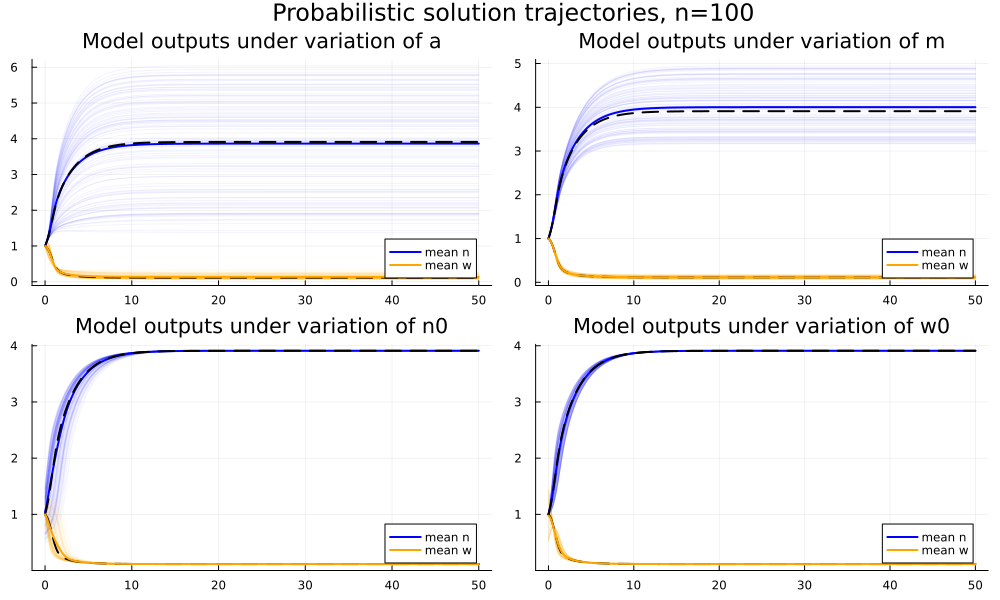

In [19]:
# plot probabilistic solution trajectories
plot(plot_a_traj, plot_m_traj, plot_n0_traj, plot_w0_traj, layout=(2,2), size=(1000,600), suptitle="Probabilistic solution trajectories, n=$n")

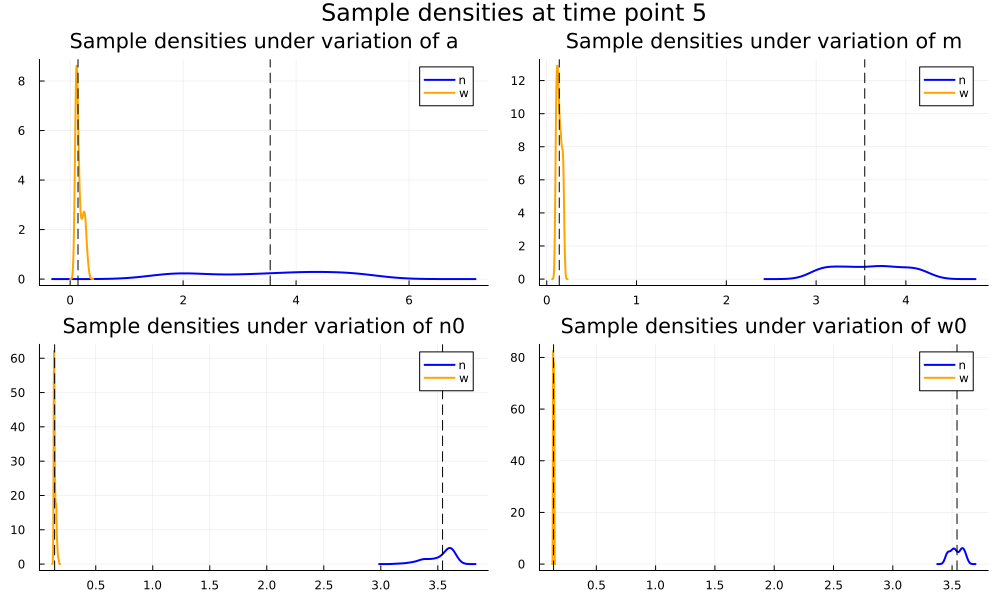

In [20]:
# plot sample densities
plot(plot_a_dens, plot_m_dens, plot_n0_dens, plot_w0_dens, layout=(2,2), size=(1000,600), suptitle="Sample densities at time point $(Int(t_pt_sample_dens/10))")